In [6]:
import tensorflow as tf
from tensorflow import keras
import cv2
import matplotlib.pyplot as plt
from skimage import io, draw
import numpy as np
import unit.img_process as imgp
import cv2

In [7]:
def show(title,image):
    ii=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)  
    io.imshow(ii)
    print(f"{title} : ")
    io.show()

In [8]:
model = keras.models.load_model("./models/deeplabv3_plus_res2netSE.h5")

In [9]:
face_cascade = cv2.CascadeClassifier("./models/haarcascade_frontalface_default.xml")   # 載入人臉模型

In [10]:
white_list = np.array([
    1, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 31, 33, 35, 37, 39,
    41, 43, 44, 46, 48, 50, 52, 53, 55, 57, 59, 60, 62, 64, 66, 67, 69, 71, 73, 74,
    76, 78, 79, 81, 83, 84, 86, 87, 89, 91, 92, 94, 95, 97, 99, 100, 102, 103, 105,
    106, 108, 109, 111, 112, 114, 115, 117, 118, 120, 121, 123, 124, 126, 127, 128,
    130, 131, 133, 134, 135, 137, 138, 139, 141, 142, 143, 145, 146, 147, 149, 150,
    151, 153, 154, 155, 156, 158, 159, 160, 161, 162, 164, 165, 166, 167, 168, 170,
    171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187,
    188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203,
    204, 205, 205, 206, 207, 208, 209, 210, 211, 211, 212, 213, 214, 215, 215, 216,
    217, 218, 219, 219, 220, 221, 222, 222, 223, 224, 224, 225, 226, 226, 227, 228,
    228, 229, 230, 230, 231, 232, 232, 233, 233, 234, 235, 235, 236, 236, 237, 237,
    238, 238, 239, 239, 240, 240, 241, 241, 242, 242, 243, 243, 244, 244, 244, 245,
    245, 246, 246, 246, 247, 247, 248, 248, 248, 249, 249, 249, 250, 250, 250, 250,
    251, 251, 251, 251, 252, 252, 252, 252, 253, 253, 253, 253, 253, 254, 254, 254,
    254, 254, 254, 254, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
    255, 255, 255, 255],dtype='uint8')

In [11]:
black_list = 255-white_list[::-1]

In [12]:
black_list

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   1,   1,   1,   1,   1,   1,   1,   2,   2,   2,
         2,   2,   3,   3,   3,   3,   4,   4,   4,   4,   5,   5,   5,
         5,   6,   6,   6,   7,   7,   7,   8,   8,   9,   9,   9,  10,
        10,  11,  11,  11,  12,  12,  13,  13,  14,  14,  15,  15,  16,
        16,  17,  17,  18,  18,  19,  19,  20,  20,  21,  22,  22,  23,
        23,  24,  25,  25,  26,  27,  27,  28,  29,  29,  30,  31,  31,
        32,  33,  33,  34,  35,  36,  36,  37,  38,  39,  40,  40,  41,
        42,  43,  44,  44,  45,  46,  47,  48,  49,  50,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  79,
        80,  81,  82,  83,  84,  85,  87,  88,  89,  90,  91,  93,  94,
        95,  96,  97,  99, 100, 101, 102, 104, 105, 106, 108, 109, 110,
       112, 113, 114, 116, 117, 118, 120, 121, 122, 124, 125, 12

0/657
frame : 


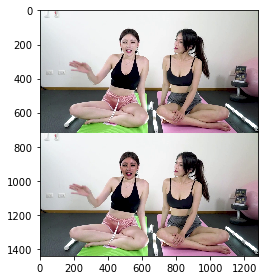

1/657
frame : 


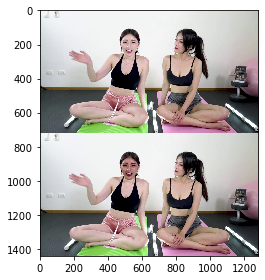

2/657
frame : 


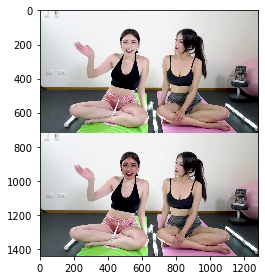

3/657
frame : 


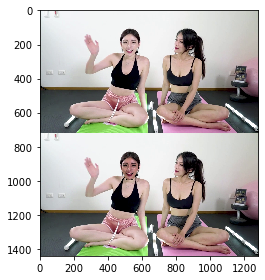

4/657
frame : 


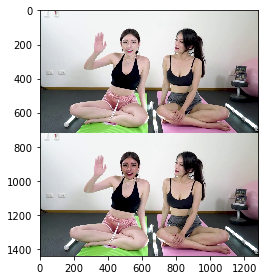

5/657
frame : 


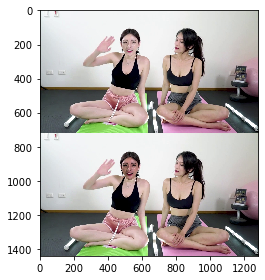

6/657
frame : 


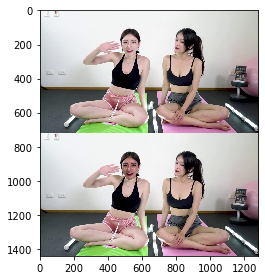

7/657
frame : 


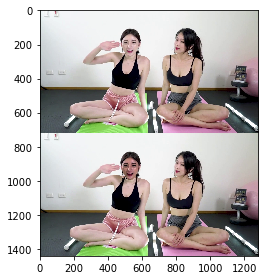

8/657
frame : 


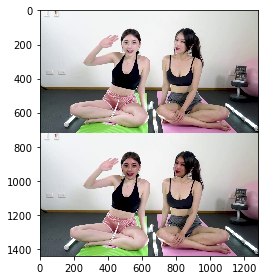

9/657
frame : 


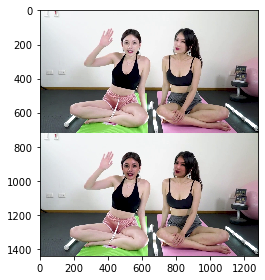

10/657
frame : 


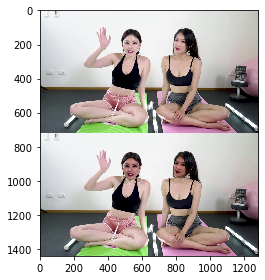

11/657
frame : 


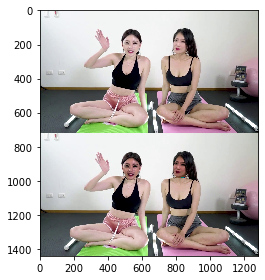

12/657
frame : 


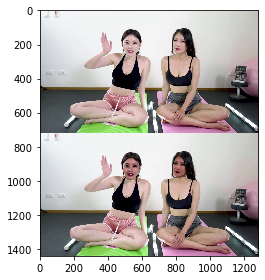

13/657
frame : 


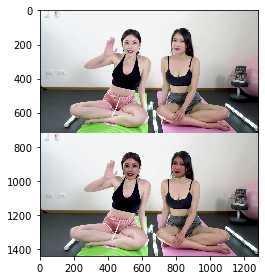

14/657
frame : 


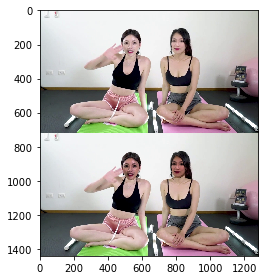

15/657
frame : 


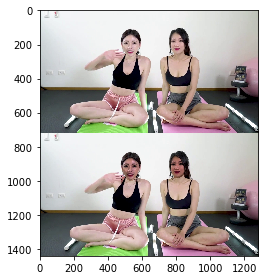

16/657
frame : 


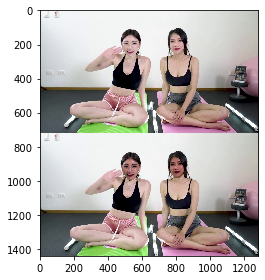

17/657
frame : 


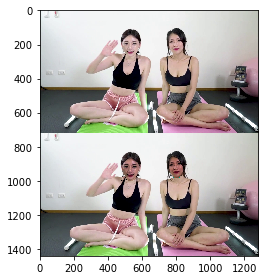

18/657
frame : 


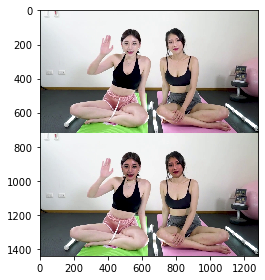

19/657
frame : 


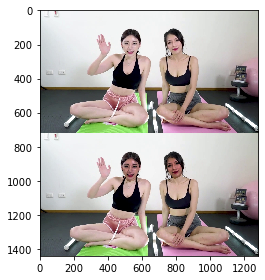

20/657
frame : 


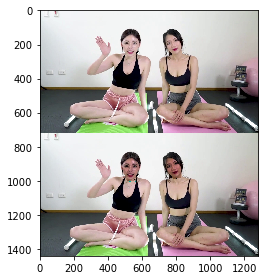

21/657
frame : 


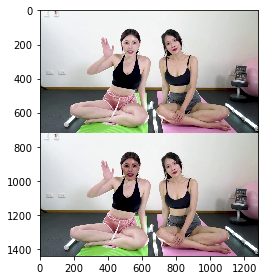

22/657
frame : 


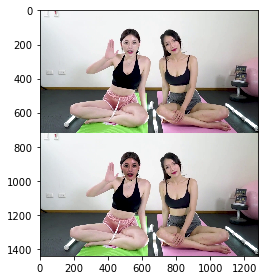

23/657
frame : 


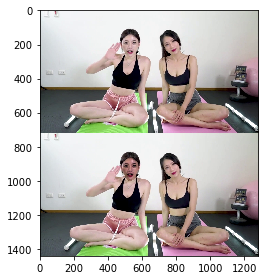

24/657
frame : 


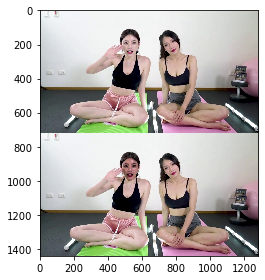

25/657
frame : 


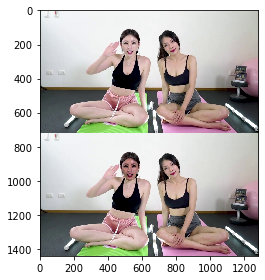

26/657
frame : 


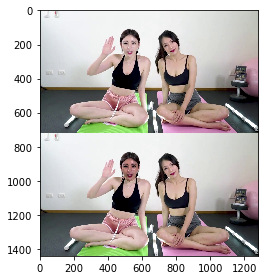

27/657
frame : 


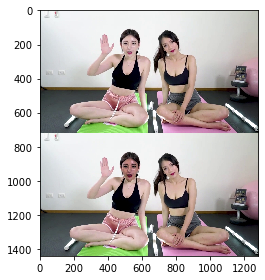

28/657
frame : 


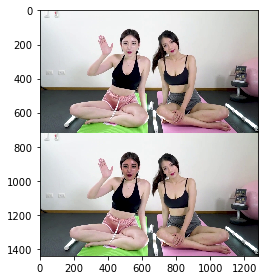

29/657
frame : 


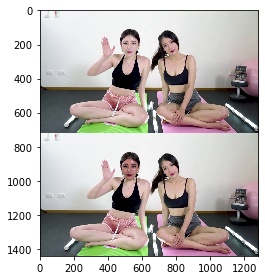

30/657
frame : 


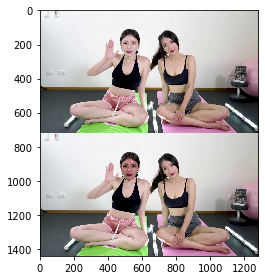

31/657
frame : 


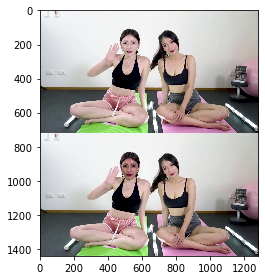

32/657
frame : 


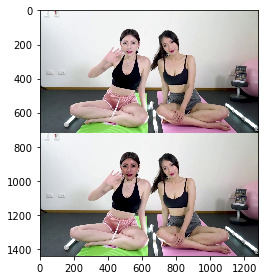

33/657
frame : 


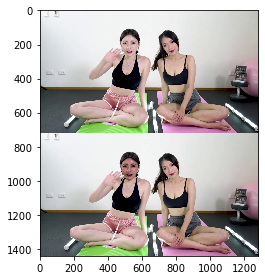

34/657
frame : 


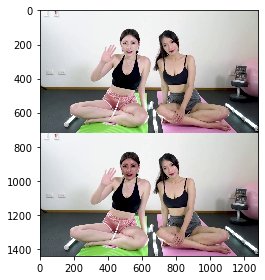

35/657
frame : 


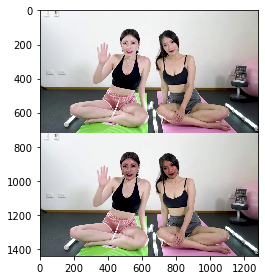

36/657
frame : 


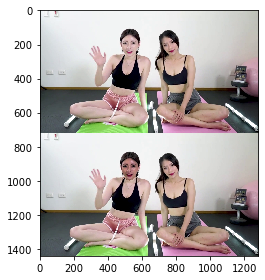

37/657
frame : 


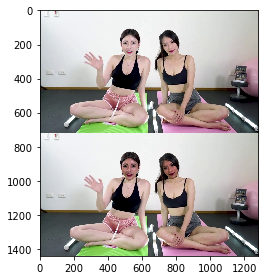

38/657
frame : 


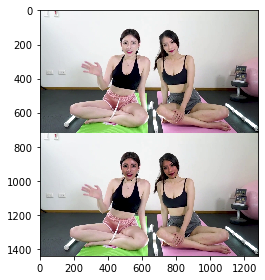

39/657
frame : 


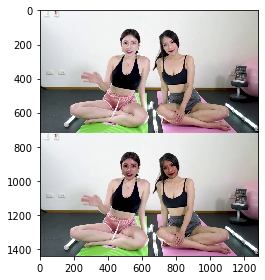

40/657
frame : 


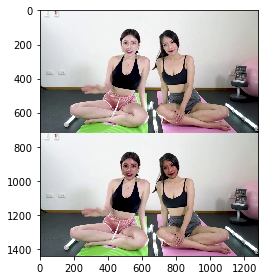

41/657
frame : 


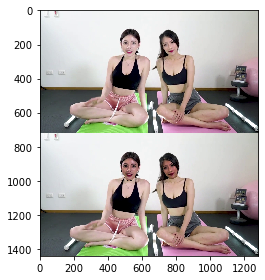

42/657
frame : 


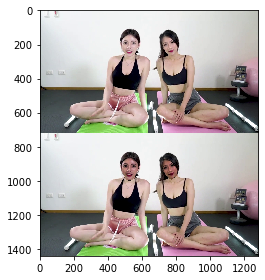

43/657
frame : 


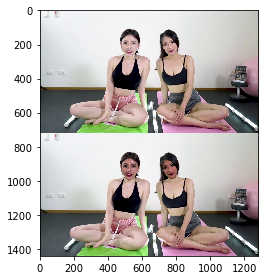

44/657
frame : 


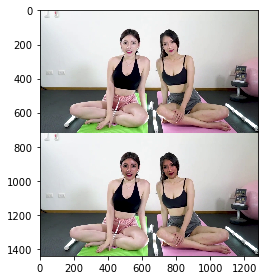

45/657
frame : 


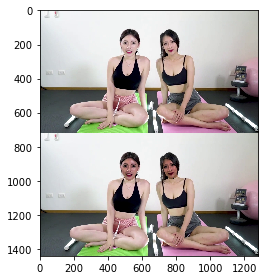

46/657
frame : 


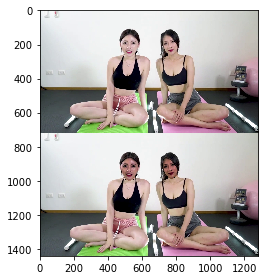

47/657
frame : 


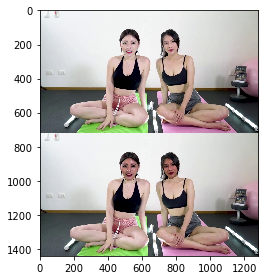

48/657
frame : 


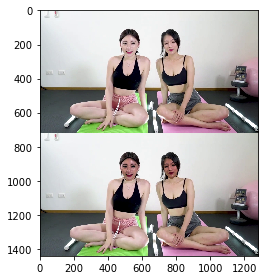

49/657
frame : 


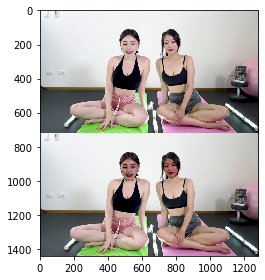

50/657
frame : 


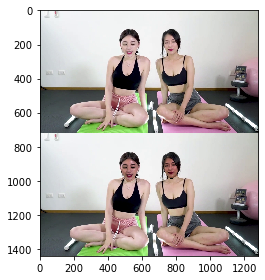

51/657
frame : 


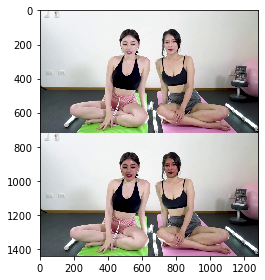

52/657
frame : 


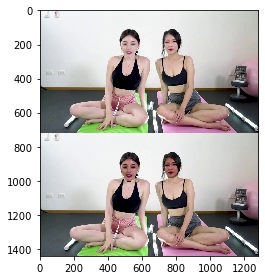

53/657
frame : 


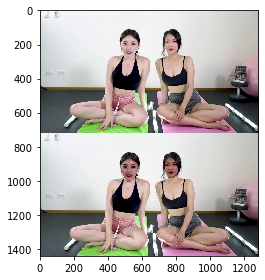

54/657
frame : 


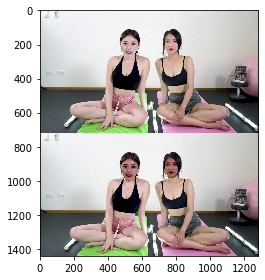

55/657
frame : 


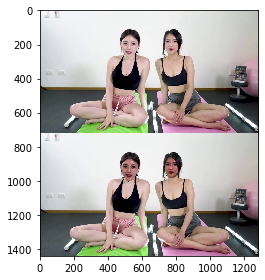

56/657
frame : 


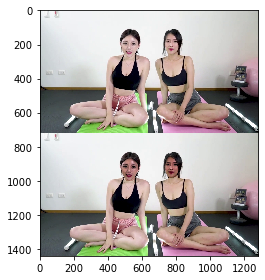

57/657
frame : 


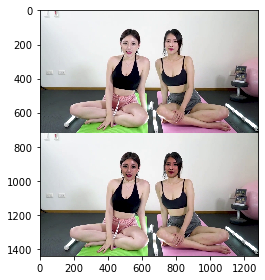

58/657
frame : 


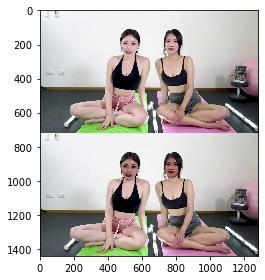

59/657
frame : 


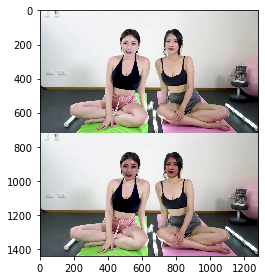

60/657
frame : 


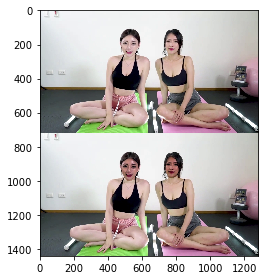

61/657
frame : 


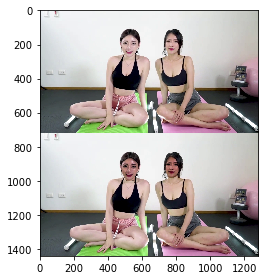

62/657
frame : 


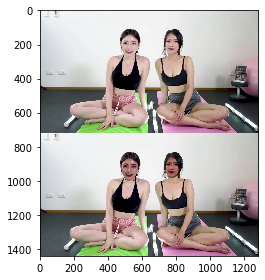

63/657
frame : 


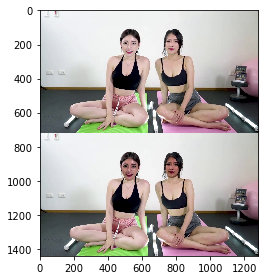

64/657
frame : 


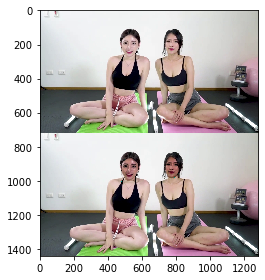

65/657
frame : 


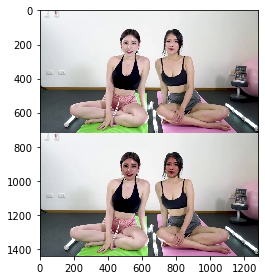

66/657
frame : 


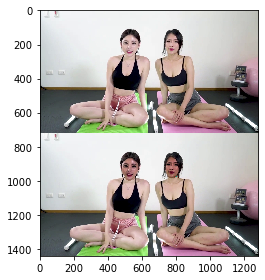

67/657
frame : 


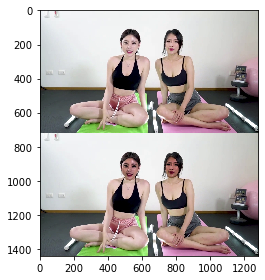

68/657
frame : 


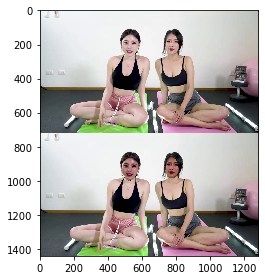

69/657
frame : 


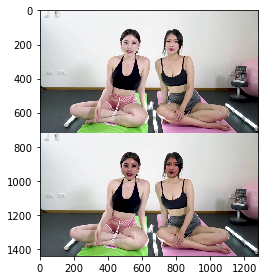

70/657
frame : 


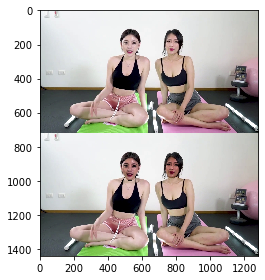

71/657
frame : 


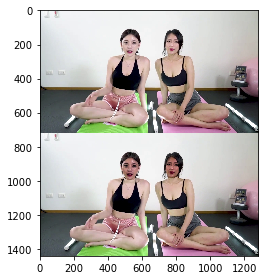

72/657
frame : 


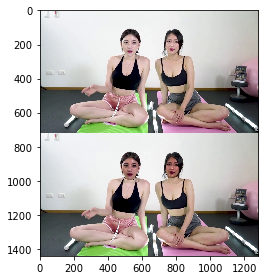

73/657
frame : 


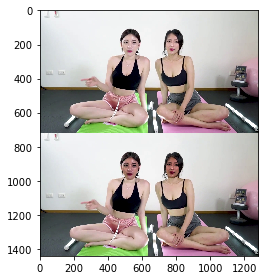

74/657
frame : 


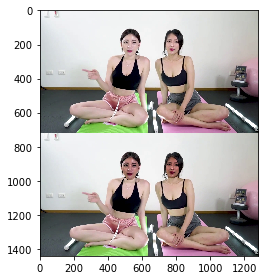

75/657
frame : 


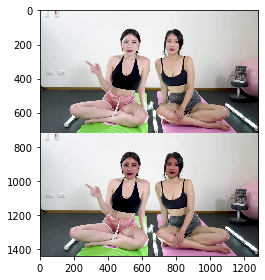

76/657
frame : 


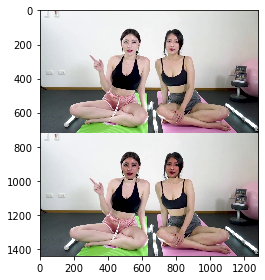

77/657
frame : 


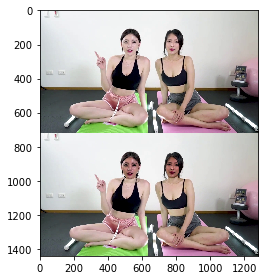

78/657
frame : 


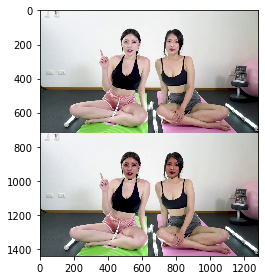

79/657
frame : 


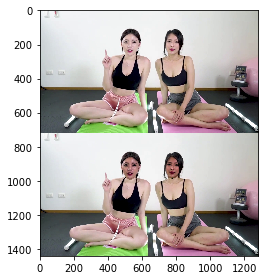

80/657
frame : 


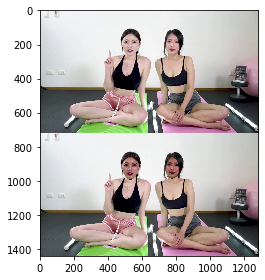

81/657
frame : 


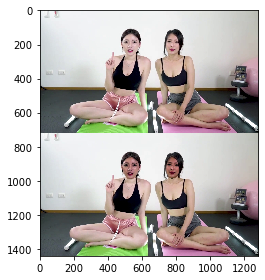

82/657
frame : 


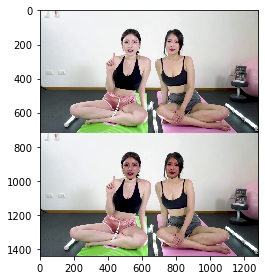

83/657
frame : 


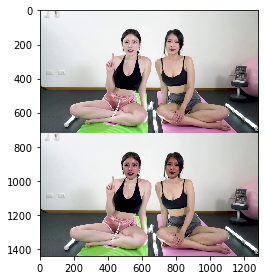

84/657
frame : 


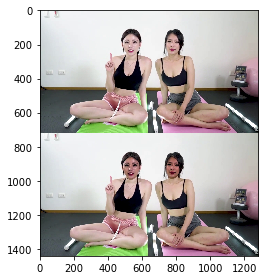

85/657
frame : 


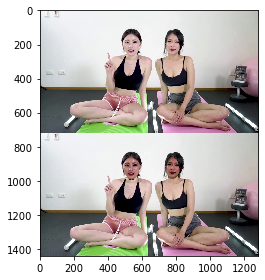

86/657
frame : 


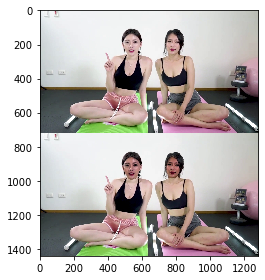

87/657
frame : 


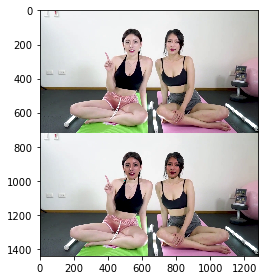

88/657
frame : 


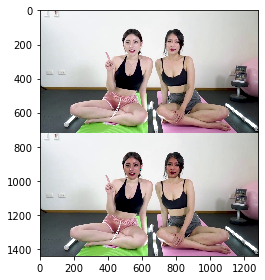

89/657
frame : 


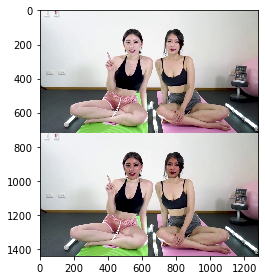

90/657
frame : 


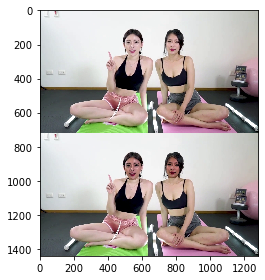

91/657
frame : 


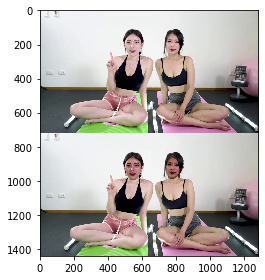

92/657
frame : 


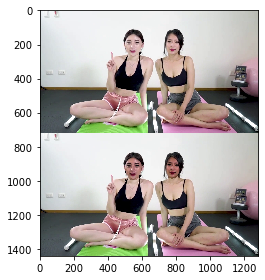

93/657
frame : 


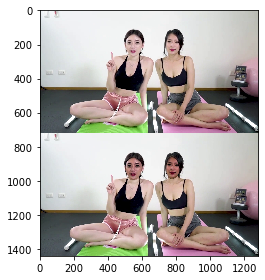

94/657
frame : 


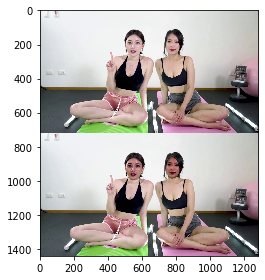

95/657
frame : 


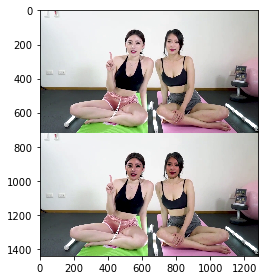

96/657
frame : 


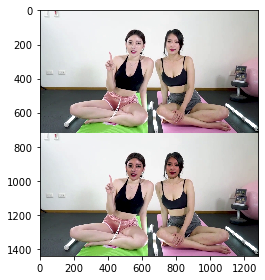

97/657
frame : 


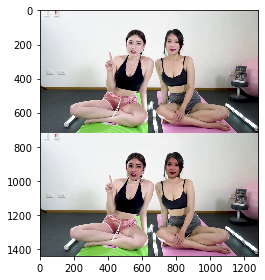

98/657
frame : 


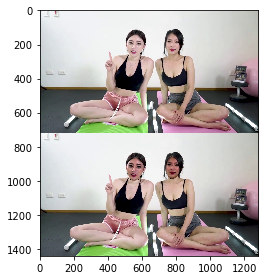

99/657
frame : 


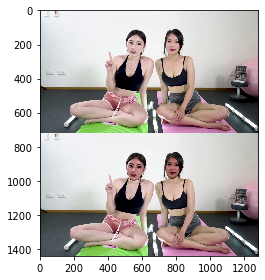

100/657
frame : 


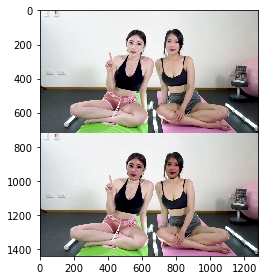

In [13]:
inp_video_path = './video_inp/777.mp4'
cap = cv2.VideoCapture(inp_video_path) # 讀取電腦中的影片
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

if not cap.isOpened():
    print("Cannot open camera")
    exit()
ret, frame = cap.read() 
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('./video_out/777_out.mp4', fourcc, 30.0, (frame.shape[1],  frame.shape[0]*2)) #輸出影片成mp4
f = 0
while True:
    ret, frame = cap.read()             
    if not ret:
        print("Cannot receive frame")  
        break
        
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)   
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=9)    # 偵測人臉
    face_img = []
    ori_frame=frame.copy()
    c_img = frame.copy()
    for (x, y, w, h) in faces:
        
        cv2.rectangle(c_img, (x, y), (x+w, y+h), (0, 255, 0), 2)    # 利用 for 迴圈，抓取每個人臉屬性，繪製方框
        crop_range = [max(0,y-50),min(y+h+50,c_img.shape[0]), max(x-50,0),min(x+w+50,c_img.shape[1])]
        temp = frame[crop_range[0]:crop_range[1], crop_range[2]:crop_range[3],:] #將原始人臉方框增大範圍
        
        face_img.append([crop_range,temp])
        
    for img_range,crop_img in face_img:
        
        mask_img = imgp.get_maskimg(model,crop_img,(512,512),debug=False)

        x1_img = crop_img.copy()
        #mask_img['face'] = white_list[mask_img['face']] #變白
        mask_img['face'] = black_list[mask_img['face']] #變黑
        x1_img[mask_img['face']!=0] = mask_img['face'][mask_img['face']!=0]
        #show('face',mask_img['face'])
        frame[img_range[0]:img_range[1], img_range[2]:img_range[3]] = x1_img
    print(f'{f}/{frame_count}')
    f+=1
    
    frame = cv2.vconcat([ori_frame,frame])
    show('frame', frame)
    out.write(frame)
    if cv2.waitKey(1) == ord('q'):     
        break

        
out.release()
cap.release()                           
cv2.destroyAllWindows() 